In [23]:
import librosa
import os
import IPython.display as ipd
from IPython.display import clear_output
import json
import torch
import numpy as np
import matplotlib.pyplot as plt

from chord_prediction import RootCNN, ChordCNN, predict

In [3]:
# Global
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# sr = 44100  

# Root
root_model = RootCNN()
root_model.load_state_dict(torch.load('rootcqtcnn_asim1_1005.pth', map_location=device))
root_model.eval()

# Chord
chord_model = ChordCNN()
chord_model.load_state_dict(torch.load('chordcqtcnn_asim1_0905.pth', map_location=device))
chord_model.eval()
clear_output(wait=True)

In [4]:
def extract_jams(jams_path):

    with open(jams_path, 'r') as f:
        jams_data = json.load(f)

    times = []
    durations = []
    chords = []

    annotations = jams_data['annotations']

    chord_annotation = None
    for ann in annotations:
        if ann['namespace'] == 'chord':
            chord_annotation = ann
            break

    if chord_annotation is not None:
        for chord_event in chord_annotation['data']:
            time = chord_event['time']
            duration = chord_event['duration']
            chord = chord_event['value']
            # print(f"Time: {time}, Duration: {duration}, Chord: {chord}")

            times.append(time)
            durations.append(duration)
            chords.append(chord)

    return times, durations, chords

def split_chord(chord):
    
    # Splits a ChoCo chord string like 'C:maj7' into (root, quality) with ':' is the only separator.
    parts = chord.split(":", 1)

    if len(parts) == 2:
        return parts[0], parts[1]

    elif chord == "NC": return "NC", "NC"
    else: return parts[0], "" 

In [6]:
y, sr = librosa.load("Choco/audio/billboard_2.flac")

ipd.Audio(y, rate=sr)

In [ ]:
qualities = []

for n in range(10):

    while not os.path.exists(f"Choco/audio/billboard_{n}.flac"): n += 1

    choco_audio = f"Choco/audio/billboard_{n}.flac"
    choco_jams = f"Choco/jams/billboard_{n}.jams"

    y, sr = librosa.load(choco_audio)

    times, durations, chords = extract_jams(choco_jams)

    count = 0

    for i in range(len(times)):

        start, end = int(times[i]*sr), int((times[i] + durations[i])*sr)
        window = y[start:end]
        prediction, pr_root, pr_chord = predict(window, root_model, chord_model, sr=sr)

        gt_root, gt_chord = split_chord(chords[i])
        if gt_root == pr_root: count += 1

        qualities.append(gt_chord)

    print(f"Root - {((count/len(chords)) * 100):.3f}%")

print(np.unique(np.array(qualities)))
        

Root Accuracy: 83/139 - 59.712%
Root Accuracy: 133/172 - 77.326%
Root Accuracy: 133/172 - 77.326%
Root Accuracy: 149/227 - 65.639%
Root Accuracy: 134/193 - 69.430%
Root Accuracy: 53/170 - 31.176%
Root Accuracy: 77/91 - 84.615%
Root Accuracy: 130/145 - 89.655%
Root Accuracy: 1/54 - 1.852%
Root Accuracy: 98/215 - 45.581%
Root Accuracy: 76/107 - 71.028%
Root Accuracy: 45/159 - 28.302%
Root Accuracy: 45/159 - 28.302%
Root Accuracy: 92/102 - 90.196%
Root Accuracy: 127/164 - 77.439%
Root Accuracy: 127/164 - 77.439%
Root Accuracy: 68/96 - 70.833%
Root Accuracy: 54/117 - 46.154%
Root Accuracy: 54/117 - 46.154%
Root Accuracy: 57/71 - 80.282%
Root Accuracy: 112/201 - 55.721%
Root Accuracy: 112/201 - 55.721%
Root Accuracy: 112/201 - 55.721%
Root Accuracy: 52/81 - 64.198%
Root Accuracy: 52/81 - 64.198%
Root Accuracy: 0/96 - 0.000%
Root Accuracy: 76/258 - 29.457%
Root Accuracy: 84/108 - 77.778%
Root Accuracy: 57/68 - 83.824%
Root Accuracy: 57/68 - 83.824%
['' '1/1' '5' '7' '7(#11)' '7/3' '7/5' '9' 

Root for billboard_99 - 67.000% - 1.6925s


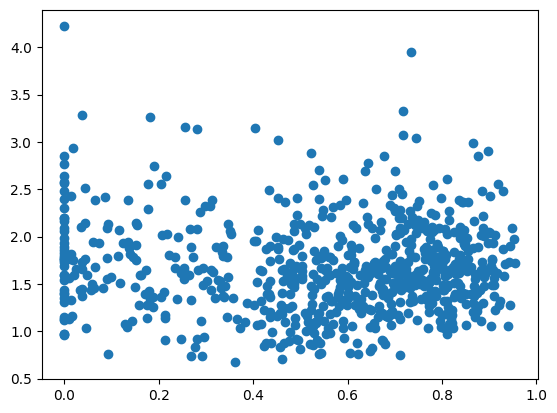

In [25]:
audio_folder = "Choco/audio"
tag_folder = "Choco/jams"

accuracies =  []
segment_lengths = []
qualities = []

for filename in os.listdir(audio_folder):
    if filename.endswith(".flac"):
        
        base_name = os.path.splitext(filename)[0]  
        
        if "billboard" in base_name: # Process only some files (bc it would take an eternity otherwise)

            audio_path = os.path.join(audio_folder, filename)
            tag_path = os.path.join(tag_folder, f"{base_name}.jams")

            if os.path.exists(tag_path):
                # print(f"Match found: {audio_path} - {tag_path}")
                
                # PROCESS #

                y, sr = librosa.load(audio_path)

                times, durations, chords = extract_jams(tag_path)

                count = 0

                for i in range(len(times)):

                    start, end = int(times[i]*sr), int((times[i] + durations[i])*sr)
                    window = y[start:end]
                    prediction, pr_root, pr_chord = predict(window, root_model, chord_model, sr=sr)

                    gt_root, gt_chord = split_chord(chords[i])
                    if gt_root == pr_root: count += 1

                    qualities.append(gt_chord)

                accuracies.append(count/len(chords))
                segment_lengths.append(np.mean(durations))
                
                clear_output(wait=True)
                print(f"Root for {base_name} - {((count/len(chords)) * 100):.3f}% - {(np.mean(durations)):.4f}s")
                plt.plot(accuracies, segment_lengths, 'o')
                plt.show()
                ###########

            else:
                print(f"Tag not found for {audio_path}")
        else: break

731
['' '(#5)' '(11)' '(11,9)' '(13)/6' '(3)' '(3)/2' '(3)/3' '(3,7)' '(b3)'
 '(b3,b7)/b7' '(b3,b7,11,9)' '(b5,11)' '(b5,b7,3)' '(b5,b7,3)/b5' '(b7)'
 '(b7)/b7' '1/1' '11' '13' '5' '5(13)' '5(b13)' '5(b7)' '5(b7)/2'
 '5(b7)/3' '5(b7)/5' '5(b7)/b7' '5/2' '5/4' '5/5' '5/6' '5/b7' '7'
 '7(#11)' '7(#9)' '7(11)' '7(b13)' '7(b13)/3' '7(b13,#9)' '7(b9)'
 '7(b9)/3' '7(b9)/4' '7(b9)/5' '7(b9)/b2' '7(b9)/b7' '7(b9,#11)'
 '7(b9,b13)' '7/2' '7/3' '7/4' '7/5' '7/6' '7/b2' '7/b3' '7/b4' '7/b5'
 '7/b7' '9' '9(#11)' '9(13)' '9(13,#11)' '9(b13)' '9/3' '9/5' 'aug'
 'aug(7)' 'aug(9)' 'aug(b7)' 'aug(b7)/3' 'aug(b7,9)' 'aug/5' 'dim'
 'dim(b13)' 'dim/#4' 'dim/7' 'dim/b2' 'dim/b3' 'dim/b5' 'dim/b7' 'dim7'
 'dim7/2' 'dim7/b3' 'hdim7' 'hdim7/4' 'hdim7/b3' 'hdim7/b5' 'hdim7/b7'
 'maj' 'maj(#11)' 'maj(#9)' 'maj(11)' 'maj(11)/4' 'maj(11)/b7' 'maj(9)'
 'maj(9)/2' 'maj(9)/3' 'maj(9)/5' 'maj(9)/6' 'maj(9,#11)' 'maj(b9)'
 'maj/#4' 'maj/2' 'maj/3' 'maj/4' 'maj/5' 'maj/6' 'maj/7' 'maj/b2'
 'maj/b3' 'maj/b4' 'maj/b5' 'm

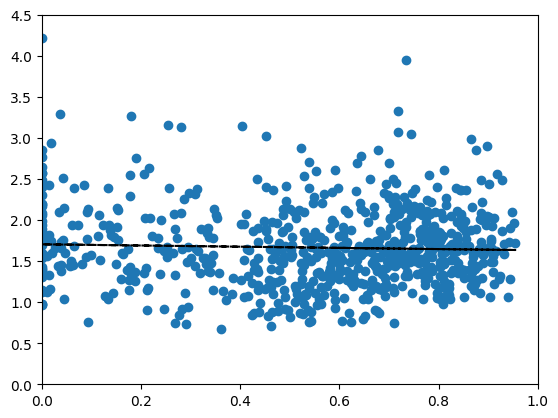

In [31]:
coef = np.polyfit(accuracies,segment_lengths,1)
poly1d_fn = np.poly1d(coef) 
plt.plot(accuracies, segment_lengths, 'o',  accuracies, poly1d_fn(accuracies), '--k')

print(len(accuracies))
print(np.unique(np.array(qualities)))

# plt.plot(accuracies, segment_lengths, 'o')
plt.xlim(0, 1)
plt.ylim(0, 4.5)

plt.show()